In [2]:
import numpy as np
import json
from pprint import pprint
import matplotlib.pyplot as plt
import matplotlib
from collections import defaultdict

plt.rcParams['figure.figsize'] = [16, 4]
from plot_utils import *

In [3]:
def plot_one_pval_TE_final(ax,run_list,main_enum,pval_list,fname_pattern,debug_tidx,rr_lambda,reg_lambda,tmle_lambda,l2_lambda,noise,topic_name,tidx,hlayer=None,num_sample=None,plot_upto=-1,plot_per_idx=1):
    #Getting the result dict
    result_dict = get_all_result_dict(
                        run_list=run_list,
                        pval_list=pval_list,
                        enum=main_enum,
                        fname_pattern=fname_pattern.format(
                                                    "{1}",
                                                    num_sample,
                                                    hlayer,
                                                    "{0}",
                                                    debug_tidx,
                                                    rr_lambda,
                                                    reg_lambda,
                                                    tmle_lambda,
                                                    l2_lambda,
                                                    noise,
                                                    topic_name,
                        )
    )

    
    #Plotting the result
    for pidx,plot_item in enumerate(plot_item_list):
        
        #Plotting the results
        item_yval = np.array([result_dict[pval][plot_item]["mean"] for pval in pval_list])
        #yerr=[0.0]*len(item_yval)
        yerr = np.array([result_dict[pval][plot_item]["std"] for pval in pval_list])
        #Plotting the item
        
        ax[pidx].plot(pval_list,item_yval,label="topic={}".format(debug_tidx),ls="-.",marker="o",alpha=0.7)
        ax[pidx].fill_between(pval_list,item_yval-yerr,item_yval+yerr,alpha=0.3)
        ax[pidx].set_xlabel("expt")
        if "te" in plot_item:
            ax[pidx].set_ylim(-0.3,0.3)
        
        ax[pidx].set_ylabel(plot_item)
        
        ax[pidx].legend()
        ax[pidx].grid(True)

In [18]:
def plot_one_pval_TE_timeline(ax,run_list,main_enum,pval_list,fname_pattern,debug_tidx,rr_lambda,reg_lambda,tmle_lambda,l2_lambda,noise,topic_name,tidx,replace_strategy=None,gval_select_mode=None,hlayer=None,num_sample=None,plot_upto=-1,plot_per_idx=1,teulim=None,tellim=None):
    #Getting the metrics
    if gval_select_mode!=None:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        noise,
                                                        topic_name,
                                                        replace_strategy,
                                                        gval_select_mode,
                            )
        )
    elif replace_strategy!=None:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        noise,
                                                        topic_name,
                                                        replace_strategy,
                            )
        )
    else:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        noise,
                                                        topic_name,
                            )
        )

    for pidx,plot_item in enumerate(plot_item_list):
        for pval in pval_list:
            #Getting the timeline item
            item_pval_yval_timeline = result_dict_timeline[pval][plot_item]["mean"].tolist()
            yerr=[0.0]*len(item_pval_yval_timeline)
            xval = list(range(len(item_pval_yval_timeline)))

            #Plotting the item
            ax[pidx,tidx].errorbar(xval[:plot_upto][::plot_per_idx],item_pval_yval_timeline[:plot_upto][::plot_per_idx],yerr[:plot_upto][::plot_per_idx],label="pval={}".format(pval),ls="-.",marker="o",alpha=0.7)
#             ax[pidx,anidx].fill_between(pval_list,ylb,yub,alpha=0.2)

            ax[pidx,tidx].set_xlabel("epoch")
            ax[pidx,tidx].set_ylabel(plot_item)
            
            ax[pidx,tidx].set_xticks(xval[:plot_upto][::plot_per_idx])
            if "te" in plot_item and (teulim!=None and tellim!=None):
                ax[pidx,tidx].set_ylim(tellim,teulim)
            
            if "acc" in plot_item:
                ax[pidx,tidx].set_ylim(0.5,1.0)
            
#             if plot_item=="rr_loss_valid":
#                 ax[pidx,tidx].set_ylim(-10,0)
            
            if plot_item=="reg_loss_valid":
                ax[pidx,tidx].legend(loc=1)
            elif plot_item=="te_valid":
                ax[pidx,tidx].legend(loc=1)
            else:
                ax[pidx,tidx].legend()
            ax[pidx,tidx].grid(True)
            
            ax[pidx,tidx].set_title("topic={}, l2={}".format(topic_name,l2_lambda))
#             ax[pidx,tidx].set_title("l2_lambda="+str(l2_lambda))
            
            
#             plot_per_idx=plot_per_idx
#             ax[pidx,].errorbar(xval[:plot_upto][::plot_per_idx],item_pval_yval_timeline[:plot_upto][::plot_per_idx],yerr[:plot_upto][::plot_per_idx],label="pval={}".format(pval),ls="-.",marker="o",alpha=0.7)
#             #ax[pidx,anidx].fill_between(pval_list,ylb,yub,alpha=0.2)

#             ax[pidx,].set_xlabel("epoch")
#             ax[pidx,].set_ylabel(plot_item)

#             ax[pidx,].legend()
#             ax[pidx,].grid(True)
            
#             ax[pidx,].set_title("topic="+topic_name)
    return result_dict_timeline

In [5]:
def select_best_config(result_timeline_dict_hpdict,select_items_config,pval,preselect_best_item=None,best_item_order=None,last_pos_selection=None):
    '''
    This function will do ranking over multiple criteria based on the mean/sum of realtive rank of the 
    items we are considering (given in the select_item list).
    
    item1 : [ranked_list1]
    item2 : [ranked_list2]
    
    Then select the joint config with best mean raking. We are not slecting based on the sum/mean of values cuz
    the scale and the sensitivity of different items could be different.
    
    preselect_best_item : we will select the values after the best val of the current item is reached
    last_pos_selection  : when we are selecting the best among different item independently and the last pos will
                            will have the best config automatically. So we will get the max val of the item for a
                            hyperparam and add a dummy pos (last pos) now
    '''
    from collections import defaultdict
    
    #First of all we will get the best location of the best item (for which we have to do the preselection)
    if preselect_best_item!=None:
        hyp_bestitem_bestloc_dict={}
        for hyp in result_timeline_dict_hpdict.keys():
            #Getting the best item timeline for this hyperparameter
            best_item_timeline = result_timeline_dict_hpdict[hyp][pval][preselect_best_item]["mean"]

            #Getting the best loc for this hyperparameter
            if best_item_order=="desc":
                best_item_bestloc = np.argmax(best_item_timeline)
            else:
                best_item_bestloc = np.argmin(best_item_timeline)
            hyp_bestitem_bestloc_dict[hyp]=best_item_bestloc
    
        
    
    #Getting the ranked list of each of the items over which we have to optimize
    item_rank_dict = {}
    for item,order in select_items_config:
        #We need to select over the best item too to do selection over the hyperparams
        #assert item!=preselect_best_item, "We should not select again on the best item, preselection done"
        
        #Going over each of the hyperparameter one by one
        item_vals = []
        for hyp in result_timeline_dict_hpdict.keys():
            #Getting the val list
            val_timeline = result_timeline_dict_hpdict[hyp][pval][item]["mean"].tolist()
            num_epochs = len(val_timeline)
            
            #Now if we want to do selection after certain location then slice
            idx_offset=0
            if preselect_best_item!=None:
                idx_offset = hyp_bestitem_bestloc_dict[hyp]
                val_timeline = val_timeline[idx_offset:]
                
            
            #Now creating the val list with the loc and val
            if last_pos_selection==True:
                item_hyp_val = np.max(val_timeline) if order=="desc" else np.min(val_timeline)
                item_vals += [(hyp,num_epochs-1,item_hyp_val)]
            else:
                item_vals += [(hyp,idx_offset+idx,val) for idx,val in enumerate(val_timeline)]
            
        #Sorting the item based on the criteria selected
        reverse_order = True if order=="desc" else False
        item_vals.sort(reverse=reverse_order,key=lambda x: x[-1])
            
        #Getting the ranking dict of each position/iteration from which we have to select
        rank_dict = {(hyp,idx):rank for rank,(hyp,idx,_) in enumerate(item_vals)}
        item_rank_dict[item]=rank_dict
        
    #Now merging the ranking to get the best location
    pos_avg_rank_dict = defaultdict(int)
    for item in item_rank_dict.keys():
        for hyp,idx in item_rank_dict[item].keys():
            pos_avg_rank_dict[(hyp,idx)]+=item_rank_dict[item][(hyp,idx)]
        
    #Getting the the position with minimum sum of rank (best ranks)
    pos_avg_rank_list = [(hyp,idx,rsum) for (hyp,idx),rsum in pos_avg_rank_dict.items()]
    pos_avg_rank_list.sort(key=lambda x: x[-1])
    
    print("best location:= hyp:{}, pos:{}, rsum:{}".format(pos_avg_rank_list[0][0],pos_avg_rank_list[0][1],pos_avg_rank_list[0][2]))
    print("top five location: ",pos_avg_rank_list[0:5])
    
    return pos_avg_rank_list[0]

# CeBAB Dataset

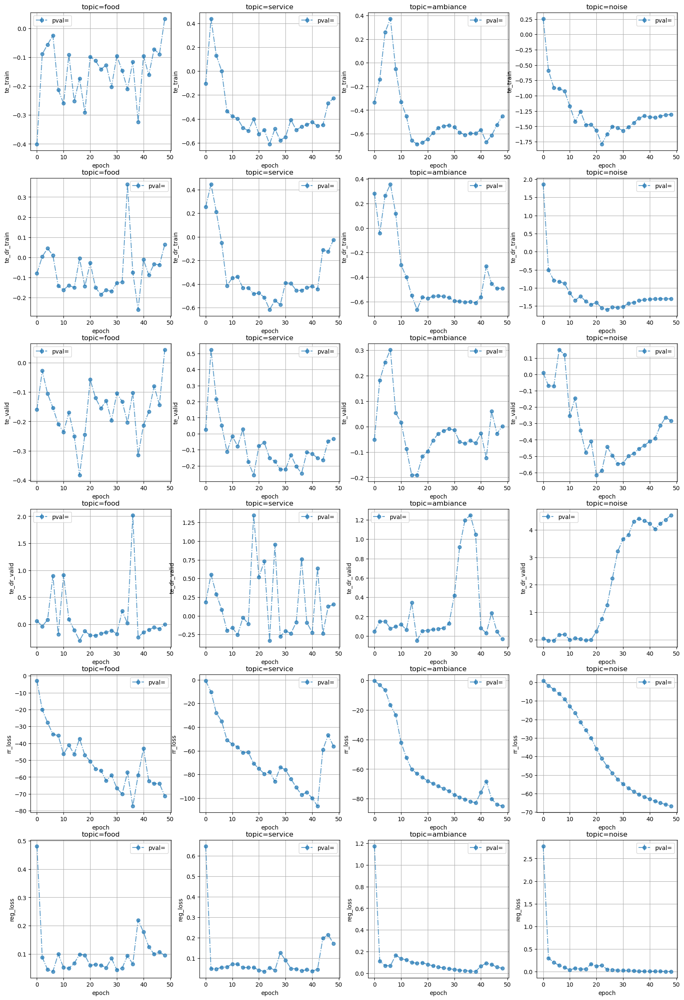

In [23]:
run_list=[1,]
main_enum=50
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda=0.0
# debug_tidx_list=[0,1]
topic_list=["food","service","ambiance","noise"]
num_sample_list=[750,500,200,65]
debug_tidx=0

pval_list=[""]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "reg_loss",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [20, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
    )
    tidx+=1

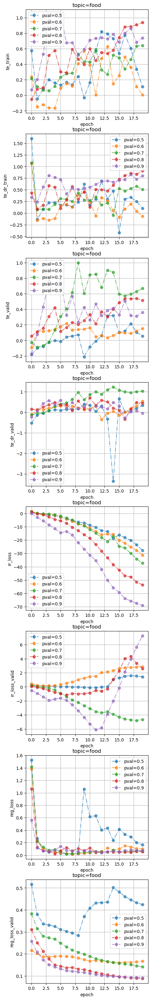

In [24]:
run_list=[3,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda = 0.0
# debug_tidx_list=[0,1]
topic_list=["food",]
num_sample_list=[350,]
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )
    tidx+=1

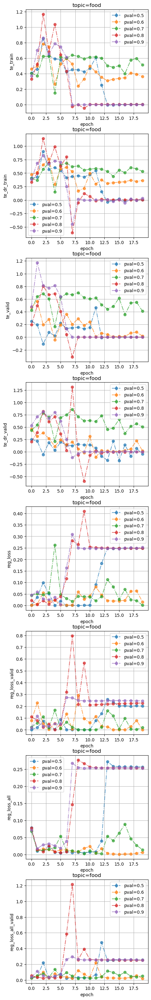

In [20]:
run_list=[5,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda = 0.0
# debug_tidx_list=[0,1]
topic_list=["food",]
num_sample_list=[350,]
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
#             "rr_loss",
#             "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_loss_all",
            "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )
    tidx+=1

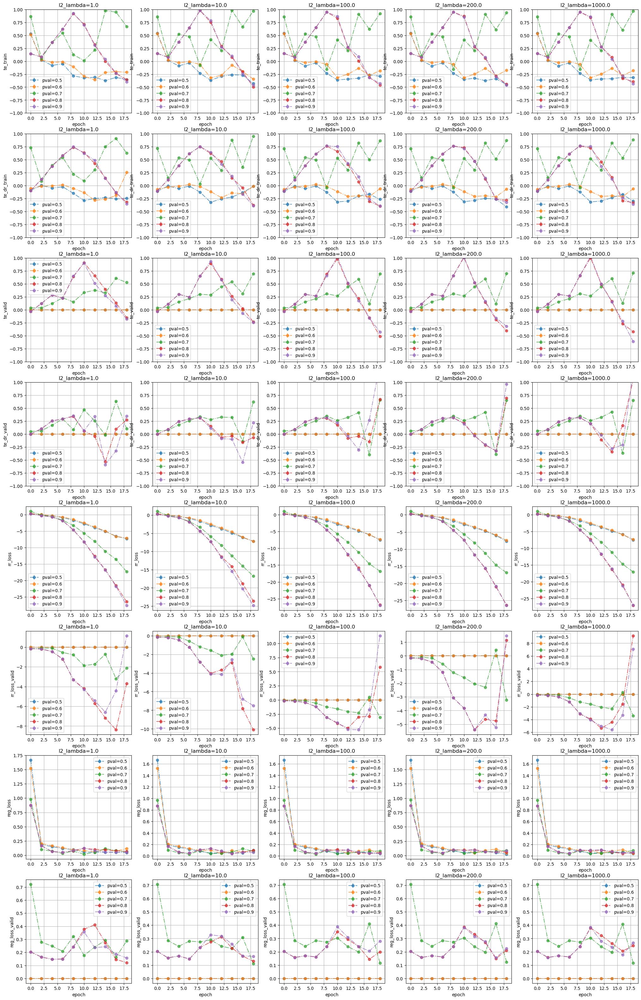

Bad pipe message: %s [b':\rte\x95 c\x8f\xe8\t\x01\xd6O\xde\xf0\xc3T\x10 F\x14C\x87\xe1\xfaa\x1c\x89\xe0h\xcd\xe9\x89\xc3\xe5\xafm\xd6\x0b{\x14\xe9vv\xf53L]%\xa5\x01\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t1', b'.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04', b'\x03\x06', b'\x07\x08']
Bad pipe message: %s [b'\t\x08\n\x08\x0b\x08\x04']
Bad pipe message: %s [b'\x08\x06\x04\x01\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 P\x07\x0eQg\xe7\xa3(`1\xe3M\x9d6\x15S\xfe\x84[A\xb1\xdc']
Bad pipe message: %s [b'\xbd\xb1\x0bHM\xeaYCI\xe4\xf8\xb6+\x13"\x84[o\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#

In [30]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[1.0,10.0,100.0,200.0,1000.0]
topic_name="noise"
num_sample=50
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )

## After symmetrization of CEBAB dataset

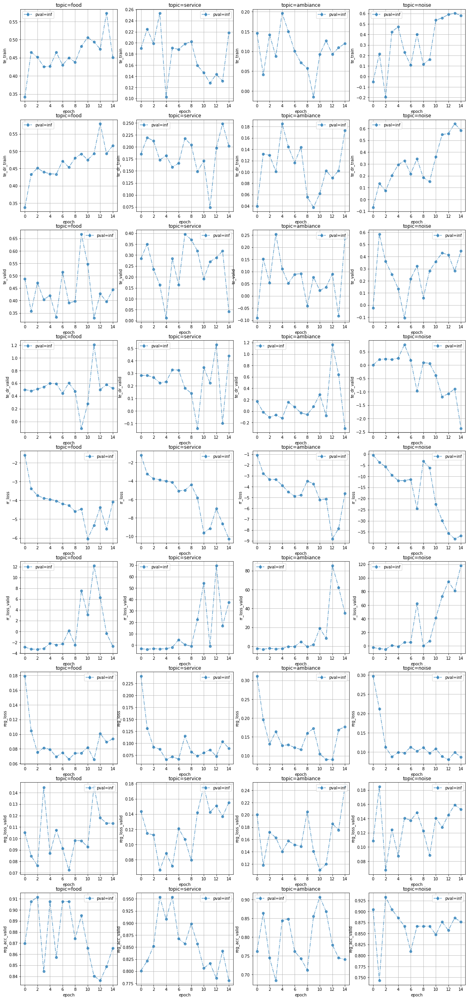

In [49]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda = 0.0
# debug_tidx_list=[0,1]
topic_list=["food","service","ambiance","noise"]
num_sample_list=[1100,900,700,500]
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [20, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=15,
                           plot_per_idx=1,
                           replace_strategy=None,
    )
    tidx+=1

best location:= hyp:200.0, pos:2, rsum:0
top five location:  [(200.0, 2, 0), (1000.0, 6, 1), (10.0, 4, 2), (100.0, 5, 3), (1.0, 3, 4)]
DE: 0.4512007534503937


best location:= hyp:100.0, pos:2, rsum:10
top five location:  [(100.0, 2, 10), (0.0, 2, 11), (1000.0, 2, 17), (0.0, 1, 19), (200.0, 2, 19)]
DR_reg_acc: 0.5139641761779785


best location:= hyp:0.0, pos:2, rsum:8
top five location:  [(0.0, 2, 8), (0.0, 1, 11), (200.0, 3, 11), (10.0, 4, 17), (200.0, 2, 18)]
DR_acc_acc: 0.5097017884254456




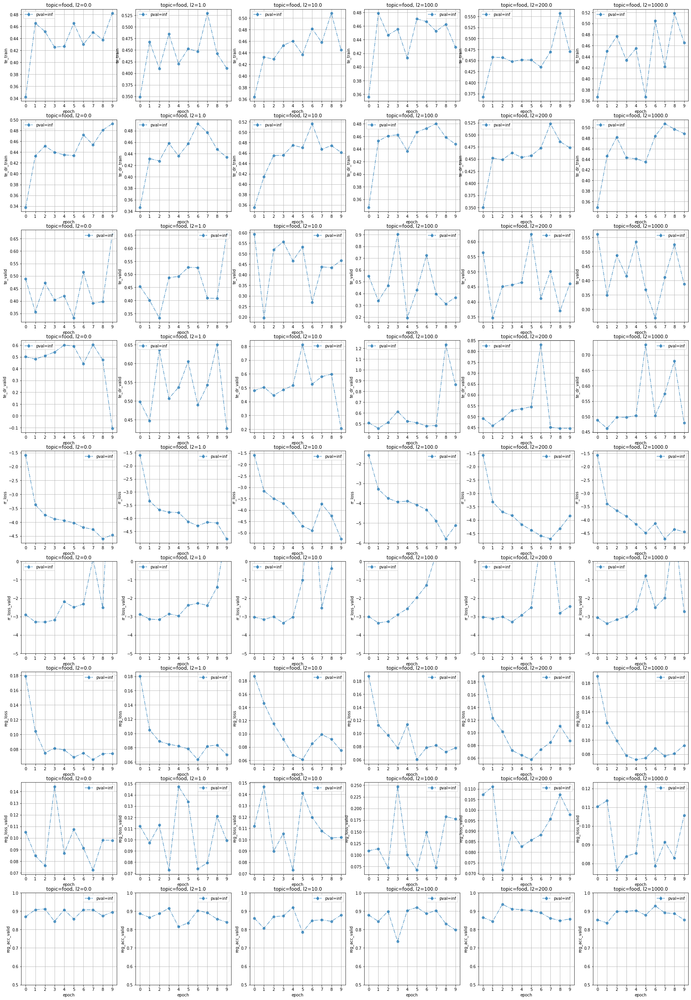

In [69]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="food"#["food","service","ambiance","noise"]
num_sample=1100 #[1100,900,700,500] #the one with symmetrization
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict={}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda] = plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=10,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    

pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## Without summetrization + bce/mse loss

best location:= hyp:0.0, pos:9, rsum:0
top five location:  [(0.0, 9, 0), (100.0, 7, 1), (100.0, 8, 2), (200.0, 9, 3), (100.0, 9, 4)]
DE: 0.0006337761878967285


best location:= hyp:0.0, pos:9, rsum:0
top five location:  [(0.0, 9, 0), (200.0, 9, 5), (100.0, 8, 6), (100.0, 7, 6), (0.0, 7, 10)]
DR_reg_acc: 0.015768354758620262


best location:= hyp:200.0, pos:9, rsum:3
top five location:  [(200.0, 9, 3), (0.0, 9, 4), (100.0, 7, 5), (100.0, 8, 7), (100.0, 6, 10)]
DR_acc_acc: 0.009953925386071205




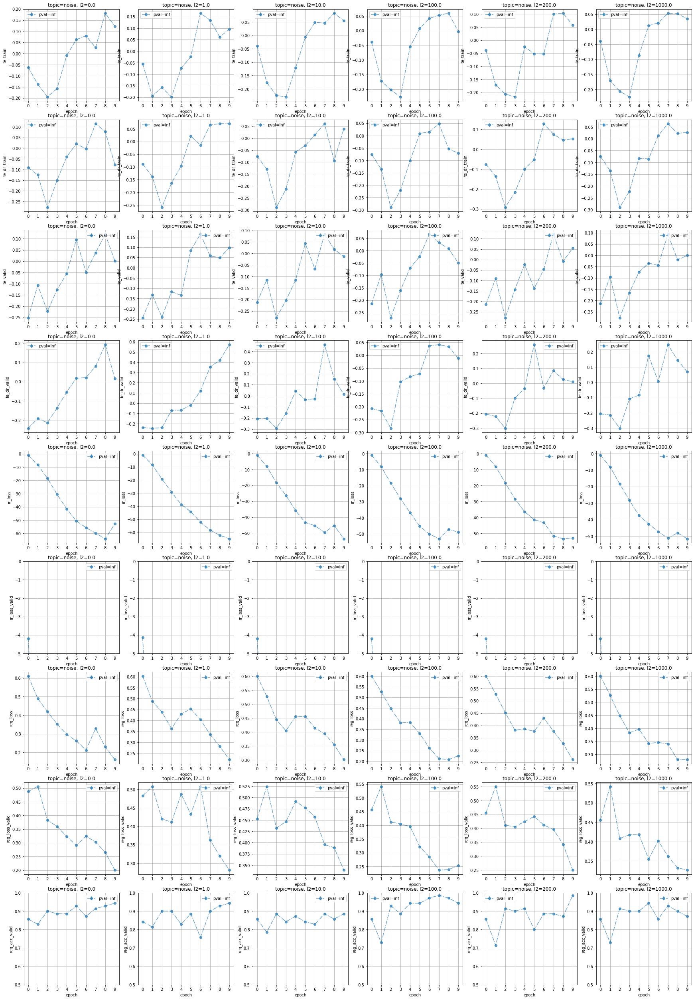

Bad pipe message: %s [b"0\x18'\x19{\n\xfd7\xe2\xe3q\xef\xd2\x86\x8d\xe4\r| \x13A4\xd9H\xb4\xc1wj\x10\xcc\xa0\x8dy\xc4\xa1\x8ef\xdb\ra=T\x1f\x96*\x826h\xa9\x1b>\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00"]
Bad pipe message: %s [b'\x0c\x00\x00\t127.0.0.1']
Bad pipe message: %s [b'\xcb\xfc \x9d\xf5\xc6o\x054\xa6R\x99\x1b=\xec\x1c!\xbc j\xa2s\x19,\xd0\xf7\x9f\xbaQ\xf2\xbc\xa1\x9e\xc3\xf3\xf8of[\x1dP\xc2\xff\xd2a\x7f\x1d\x02\x04\x1en\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xdbohG\x13\x9d\xf79B\x03\xea\x80I4B&\xaba\xe1\xcfr\x87\xcc\xb0\x0f\xb7\xf9\xc2&v\xd3z']
Bad pipe messa

In [102]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="noise"#["food","service","ambiance","noise"]
num_sample=320 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(bce)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=10,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## Hashing the best alpha

best location:= hyp:1.0, pos:4, rsum:0
top five location:  [(1.0, 4, 0), (200.0, 4, 1), (0.0, 3, 2), (0.0, 9, 3), (1.0, 3, 4)]
DE: 0.39796382188796997


best location:= hyp:0.0, pos:3, rsum:9
top five location:  [(0.0, 3, 9), (1.0, 4, 10), (100.0, 3, 11), (1.0, 5, 12), (0.0, 2, 15)]
DR_reg_acc: 0.4511515498161316


best location:= hyp:100.0, pos:3, rsum:8
top five location:  [(100.0, 3, 8), (0.0, 3, 9), (1.0, 4, 10), (0.0, 2, 12), (1.0, 3, 12)]
DR_acc_acc: 0.42006635665893555




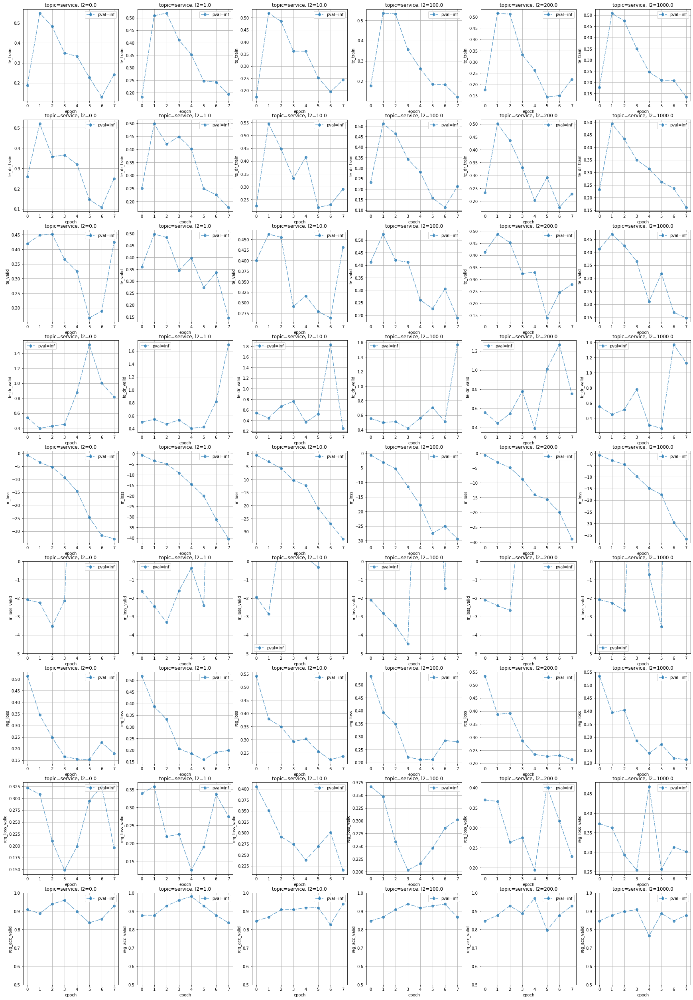

In [103]:
run_list=[11,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="service"#["food","service","ambiance","noise"]
num_sample=460 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(bce)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=8,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   preselect_best_item = "rr_loss_valid",
                   best_item_order = "inc",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   preselect_best_item = "rr_loss_valid",
                   best_item_order = "inc",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## Choosing both the gval and the alpha independently

best location:= hyp:10.0, pos:19, rsum:0
top five location:  [(10.0, 19, 0), (100.0, 19, 1), (1.0, 19, 2), (1000.0, 19, 3), (0.0, 19, 4)]
DE: 0.037651147693395615


best location:= hyp:10.0, pos:19, rsum:0
top five location:  [(10.0, 19, 0), (0.0, 19, 3), (200.0, 19, 4), (1.0, 19, 7), (1000.0, 19, 8)]
DR_reg_acc: 0.10702525824308395


best location:= hyp:10.0, pos:19, rsum:0
top five location:  [(10.0, 19, 0), (1.0, 19, 4), (0.0, 19, 5), (100.0, 19, 6), (1000.0, 19, 7)]
DR_acc_acc: 0.10702525824308395




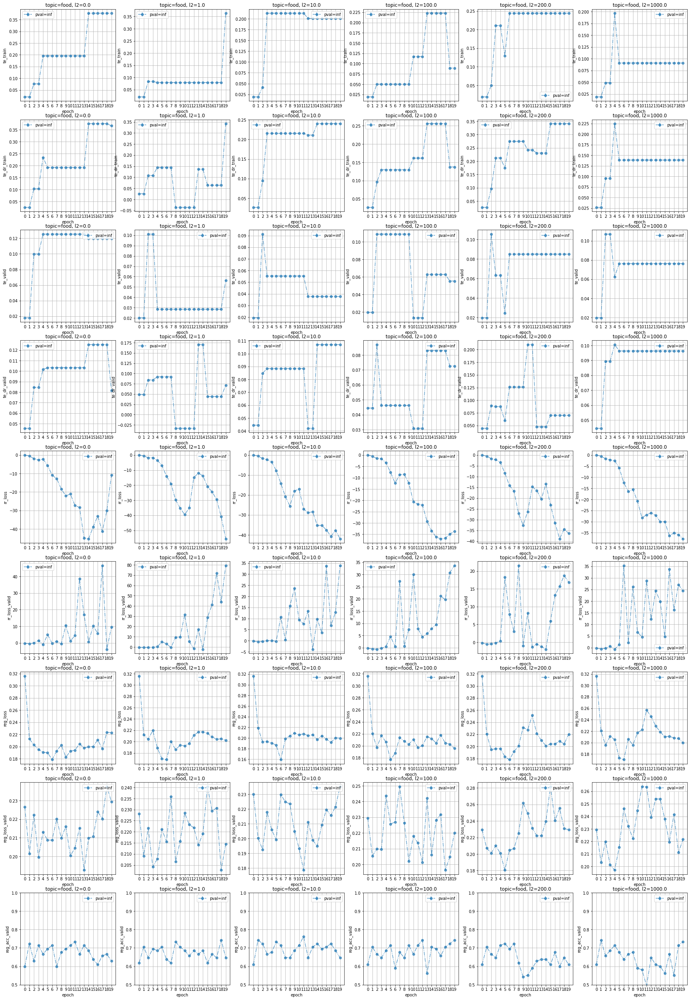

Bad pipe message: %s [b'\xa1\x9f+\xc888\xcf']
Bad pipe message: %s [b"\x81\xcc\x90]\x0c<\x1f\x9e-\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x00\x9c\xc0\xa0\xc0\x9c\xc0P\x00=\x00<\x005\x00/\x00\x9a\x00\x99\xc0\x07\xc0\x11\x00\x96\x00\x05\x00\xff\x01\x00\x00j\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x000\x00.\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05"]
Bad pipe message: %s [b'\x04\x01\x05\x01\x06\x01\x03']
Bad pipe message: %s [b'\x03\x03']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'', b'\x02']
Bad pipe message: %s [b'\x05\x02\x06']
Bad pipe me

Bad pipe message: %s [b'\xf8\xdb\tm\xfa\x1c\x1b\xe5\x15\x05\x91H\xd5\\$\xb82\xfb @n']
Bad pipe message: %s [b"\r\xaf\xb6\xd7'\xed\x07\x90\xf5\x15\xc5$m\xa8mue|\xf7\x06\xf7\x87\xc2\x1b\x19\x8a\xae(\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c"]
Bad pipe message: %s [b'\xe15.\x0cAR:\x8dH\xa0\x88\x8f\xbf\xf1\x9d\xd2]\x1c \x17\xc3[P\xe9R\xe3\t=\xee\xee\xe8.G\xb9e\xa1Ai\x00\xdf\x95\xb3\xb1t\xa6\x83\xba\xdf\xd7\xbe\xb1\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x

In [16]:
run_list=[14,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="food"#["food","service","ambiance","noise"]
num_sample=500 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.3

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(mse)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
                   last_pos_selection=True,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   last_pos_selection=True,  
#                    preselect_best_item = "rr_loss_valid",
#                    best_item_order = "inc",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   last_pos_selection=True
#                    preselect_best_item = "rr_loss_valid",
#                    best_item_order = "inc",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## Which expt is this

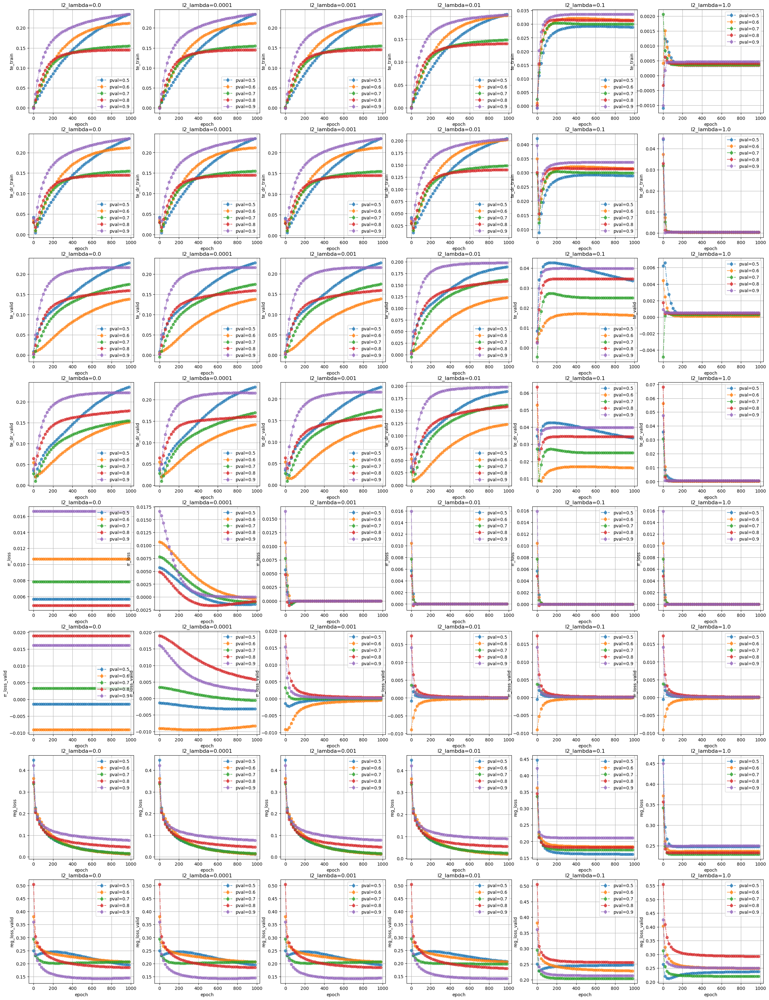

In [11]:
run_list=[4,]
main_enum=1000
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,0.0001,0.001,0.01,0.1,1.0]#20.0,100.0,200.0,1000.0]
topic_name="food"
num_sample=350
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=1000,
                           plot_per_idx=10,
    )

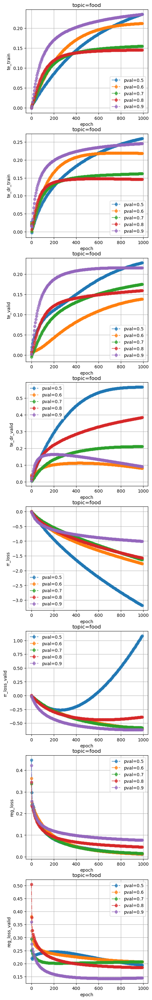

In [16]:
run_list=[4,]
main_enum=1000
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda=0.0
# debug_tidx_list=[0,1]
topic_list=["food",]
num_sample_list=[350,]
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=-1,
    )
    tidx+=1

# CivilComments Dataset

TypeError: plot_one_pval_TE_timeline() missing 1 required positional argument: 'replace_strategy'

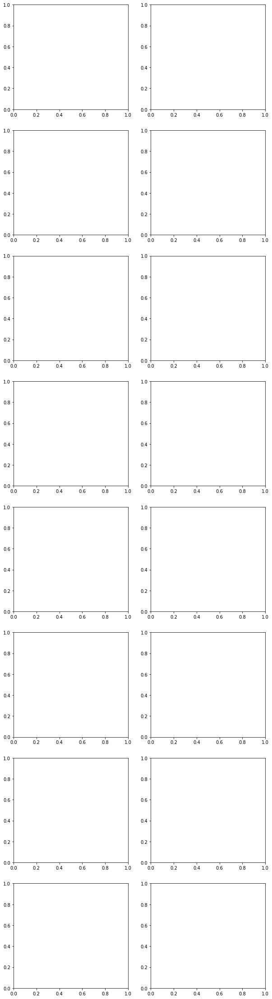

In [53]:
run_list=[8,]
main_enum=5
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,0.0]
topic_name="race"
num_sample=5000
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )

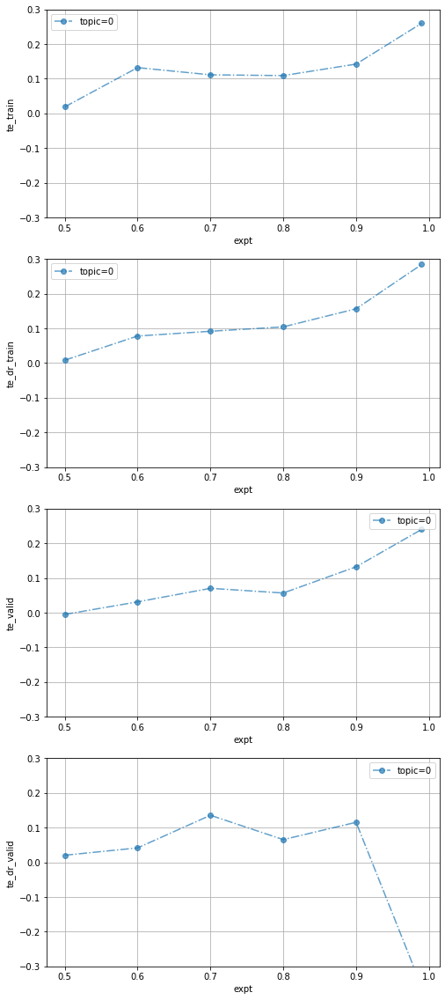

Bad pipe message: %s [b'\xffn\xf1\xa0T\xff\xe5H\x96\x9c\x02z\xc8\xf0:\x94G\xe6 \x11K_~=\xd0\x04\xe1\x0c\x9f4l?\x16\xde\xcd\xdbk\xa1y9r\x8bO\xd5\x80\xbb=\xe8u\xcdu\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08', b'\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \x16\xde\xf2\x16RBS\x82L\x0b\xee\xd9k?]0\xaf\xf7\xc9\xeb\xe7|']
Bad pipe message: %s [b'\xc7\x00\x08>\xe9@\xc1\xb4&\xbb\xeak-H\x8f\xb2\xe3F \xffS\xb2\x9d7\xdfqg\x1e\xdb\x83\xa8Q\x18F\x8f\xb11', b'\x891&\x8dx\xcf\x04\x82\xc3\xa4R\xf6\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\

Bad pipe message: %s [b"\x919\x0evp\xb2\xdc\xcb4\r\xbd\x7f\xe2\xb3\xe4\x12\xdf: \xdb|'\x84\xc54jj?\xb9LB~.\xc6\x91\x1a\xfb\xd3\xb4\x94\xe9\x1f\xd4J\x9d3\xf8/\xf0\x94\xa1\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00", b'\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05']
Bad pipe message: %s [b'\x03\x08']
Bad pipe message: %s [b'\x08\x08\t\x08\n\x08']
Bad pipe message: %s [b'\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xe3+\x95\x9b\x18\xd9\xbb\x9b\x97%+\x81\xa1I\x1f\x12\xe4\xfc\x94\xcc\xb5\xc8']
Bad pipe message: %s [b"}\xf3\xbdRv!\x06\xda\xe6\xd5\x93-\\[Q\xa34\x13\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\x

In [31]:
run_list=[8,]
# main_enum=2
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
# l2_lambda_list=[0.0,0.0]
l2_lambda=0.0
topic_name="gender"
num_sample=5000
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
#             "rr_loss",
#             "rr_loss_valid",
#             "reg_loss",
#             "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [8,5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list))


# for lidx,l2_lambda in enumerate(l2_lambda_list):
fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
plot_one_pval_TE_final(ax=ax,
                       run_list=run_list,
                       num_sample=num_sample,
                       pval_list=pval_list,
                       hlayer=hlayer,
                       main_enum=main_enum,
                       fname_pattern=fname_pattern,
                       debug_tidx=debug_tidx,
                       rr_lambda=rr_lambda,
                       reg_lambda=reg_lambda,
                       tmle_lambda=tmle_lambda,
                       l2_lambda=l2_lambda,
                       noise=noise,
                       topic_name=topic_name,
                       tidx=lidx,
                       plot_upto=20,
                       plot_per_idx=1,
)

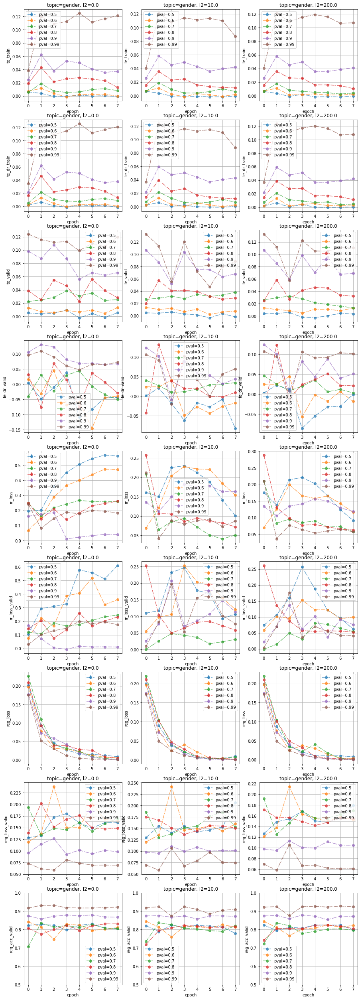

Bad pipe message: %s [b' $\x18\x97\xac\xf2\xf7Q\xb9\x1f\x99\xaeh\x9aZ\xdf\xdf\xb9 o`\xe7\x13\xc1t\x17\x87\x15\xf8\xa0\x0fn\xbc\xa3\t\xf1/l\rP\x9d\x17}\x85\x03\x18~NT\x83\x03\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00']
Bad pipe message: %s [b'\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06']
Bad pipe message: %s [b'\x07\x08']
Bad pipe message: %s [b'\t\x08\n\x08\x0b\x08\x04']
Bad pipe message: %s [b'\x08\x06\x04\x01\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xcc\x99.x\xdf\xfc\x1au^X\x9f@"\xdb\x91\x16\x1e\xfbP\xae\x1aK']
Bad pipe message: %s [b'/\x8c\xb3\x10=\xcb?\xa8.\xcc\xd9=\xa1\xd3b\xca`\xdc\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f']
Bad pipe message: %s [b"\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\

In [17]:
run_list=[8,]
main_enum=5
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,10.0,200.0]
topic_name="gender"
num_sample=5000
debug_tidx=0
replace_strategy="remove"

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).replace_strategy({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=replace_strategy,
    )

# AAE dataset with chatgpt cf

## only gval training 

pval: 0.5
best location:= hyp:1.0, pos:7, rsum:0
top five location:  [(1.0, 7, 0), (10.0, 7, 1), (200.0, 19, 2), (100.0, 7, 3), (0.0, 7, 4)]
DE: 0.006612077821046114


best location:= hyp:200.0, pos:0, rsum:0
top five location:  [(200.0, 0, 0), (200.0, 2, 1), (200.0, 1, 2), (200.0, 3, 3), (200.0, 4, 4)]
DE(loss): -0.05391806736588478


pval: 0.6
best location:= hyp:100.0, pos:7, rsum:0
top five location:  [(100.0, 7, 0), (1.0, 7, 1), (10.0, 7, 2), (1000.0, 7, 3), (0.0, 7, 4)]
DE: 0.08748625963926315


best location:= hyp:200.0, pos:1, rsum:0
top five location:  [(200.0, 1, 0), (200.0, 2, 1), (200.0, 0, 2), (200.0, 3, 3), (200.0, 4, 4)]
DE(loss): 0.04698683321475983


pval: 0.7
best location:= hyp:10.0, pos:7, rsum:0
top five location:  [(10.0, 7, 0), (1.0, 7, 1), (0.0, 7, 2), (1000.0, 7, 3), (100.0, 7, 4)]
DE: 0.12965260446071625


best location:= hyp:200.0, pos:1, rsum:0
top five location:  [(200.0, 1, 0), (200.0, 0, 1), (200.0, 3, 2), (200.0, 4, 3), (200.0, 5, 4)]
DE(loss): 0.0718763

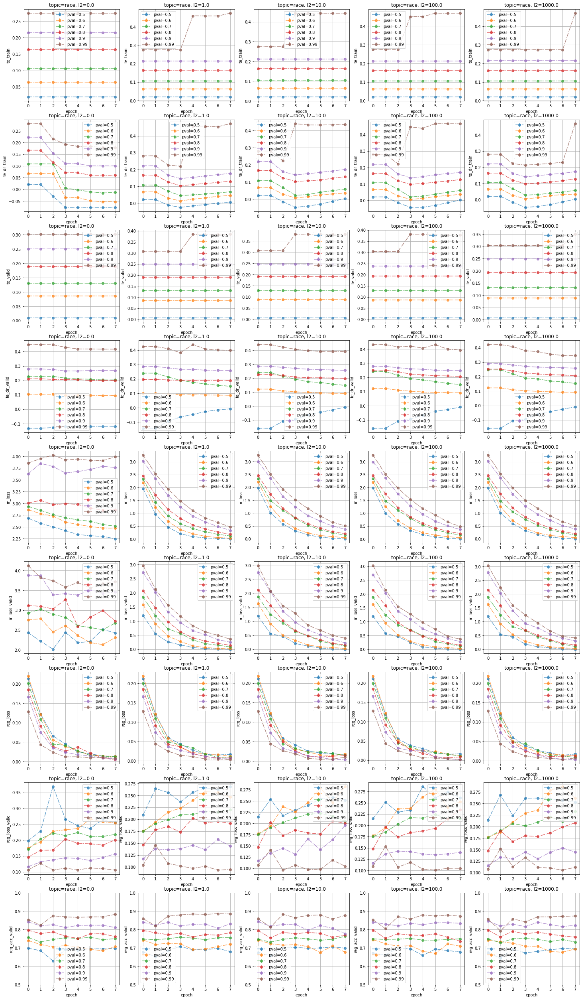

In [37]:
run_list=[0,]#with gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,1000.0]
topic_name="race"
num_sample=10000
debug_tidx=0
replace_strategy="gpt3"
gval_select_mode="acc" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).replace_strategy({})/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=replace_strategy,
                           gval_select_mode=gval_select_mode,
    )
    



for pval in pval_list:
    print("======================================================")
    print("pval:",pval)
    #Selecting the best hyperparameter
    de_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
    #                                ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
                                   ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
                       last_pos_selection=True,
    )
    print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))
    
    #Selecting the best hyperparameter (de using the valid acc)
    de_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
#                                    ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
#                        last_pos_selection=True,
    )
    print("DE(loss): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



#     dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
#                        select_items_config=[
#                                    ("rr_loss_valid","inc"),
#                                    ("reg_loss_valid","inc"),
#     #                                ("reg_acc_valid","desc"),
#                        ],
#                        pval=pval,
#                        last_pos_selection=True,  
#     #                    preselect_best_item = "rr_loss_valid",
#     #                    best_item_order = "inc",
#     )
#     print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


#     dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
#                        select_items_config=[
#                                    ("rr_loss_valid","inc"),
#     #                                ("reg_loss_valid","inc"),
#                                    ("reg_acc_valid","desc"),
#                        ],
#                        pval=pval,
#                        last_pos_selection=True
#     #                    preselect_best_item = "rr_loss_valid",
#     #                    best_item_order = "inc",
#     )
#     print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## with gval and alpha selection

pval: 0.5
best location:= hyp:100.0, pos:19, rsum:0
top five location:  [(100.0, 19, 0), (200.0, 19, 1), (0.0, 19, 2), (10.0, 19, 3), (1.0, 19, 4)]
DE: -0.00027484423480927944


best location:= hyp:1.0, pos:3, rsum:0
top five location:  [(1.0, 3, 0), (1.0, 2, 1), (1.0, 6, 2), (1.0, 5, 3), (1.0, 13, 4)]
DE(loss): -0.0635961964726448


best location:= hyp:1000.0, pos:19, rsum:1
top five location:  [(1000.0, 19, 1), (1.0, 19, 2), (100.0, 19, 3), (10.0, 19, 7), (200.0, 19, 7)]
DR_reg_acc: 0.01860620640218258


best location:= hyp:100.0, pos:19, rsum:2
top five location:  [(100.0, 19, 2), (1.0, 19, 4), (200.0, 19, 5), (1000.0, 19, 6), (10.0, 19, 6)]
DR_acc_acc: 0.010168601758778095


pval: 0.6
best location:= hyp:10.0, pos:19, rsum:0
top five location:  [(10.0, 19, 0), (1.0, 19, 1), (1000.0, 19, 2), (200.0, 19, 3), (100.0, 19, 4)]
DE: 0.12452944368124008


best location:= hyp:1.0, pos:6, rsum:0
top five location:  [(1.0, 6, 0), (1.0, 4, 1), (1.0, 5, 2), (1.0, 3, 3), (0.0, 0, 4)]
DE(loss): 0

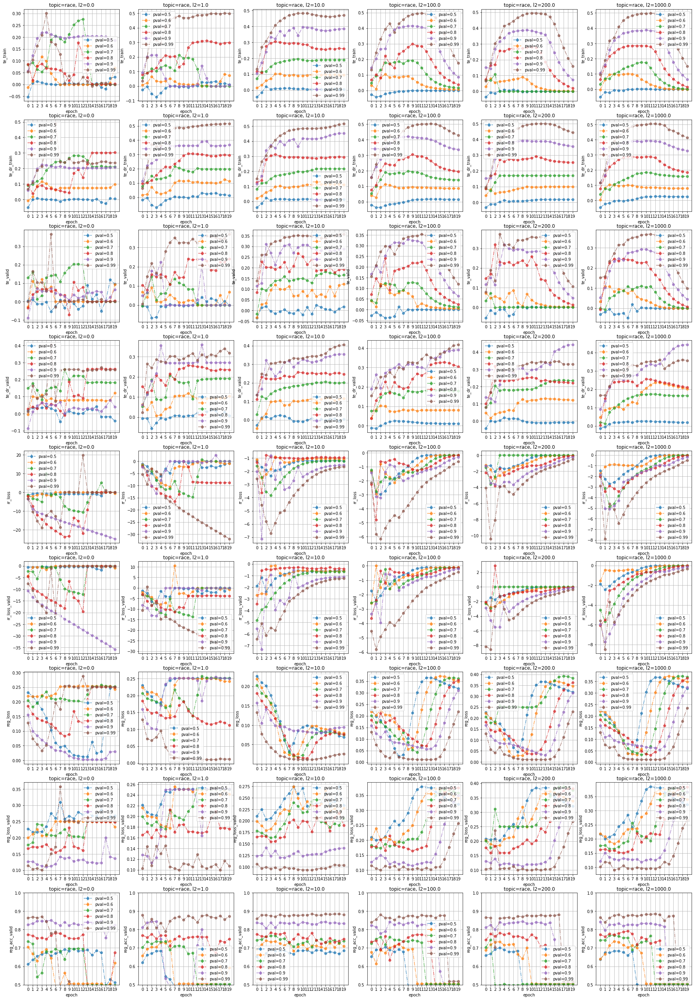

In [35]:
run_list=[0,]#with gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,200.0,1000.0]
topic_name="race"
num_sample=10000
debug_tidx=0
replace_strategy="gpt3"
gval_select_mode="acc" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}.tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=replace_strategy,
                           gval_select_mode=gval_select_mode,
    )
    



for pval in pval_list:
    print("======================================================")
    print("pval:",pval)
    #Selecting the best hyperparameter
    de_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
    #                                ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
                                   ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
                       last_pos_selection=True,
    )
    print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))
    
    #Selecting the best hyperparameter (de using the valid acc)
    de_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
#                                    ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
#                        last_pos_selection=True,
    )
    print("DE(loss): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



    dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
                                   ("reg_loss_valid","inc"),
    #                                ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
                       last_pos_selection=True,  
    #                    preselect_best_item = "rr_loss_valid",
    #                    best_item_order = "inc",
    )
    print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


    dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
                                   ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
                       last_pos_selection=True
    #                    preselect_best_item = "rr_loss_valid",
    #                    best_item_order = "inc",
    )
    print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## without best gval and alpha selection

pval: 0.5
best location:= hyp:10.0, pos:1, rsum:0
top five location:  [(10.0, 1, 0), (10.0, 2, 1), (200.0, 3, 2), (200.0, 4, 3), (1000.0, 5, 4)]
DE(acc): -0.005700290203094482


best location:= hyp:0.0, pos:4, rsum:0
top five location:  [(0.0, 4, 0), (0.0, 3, 1), (1.0, 1, 2), (1.0, 13, 3), (1.0, 16, 4)]
DE(loss): -0.0013668646570295095


best location:= hyp:1.0, pos:1, rsum:5
top five location:  [(1.0, 1, 5), (10.0, 1, 7), (1000.0, 1, 13), (200.0, 2, 19), (10.0, 3, 22)]
DR_reg_acc: 0.03349626809358597


best location:= hyp:10.0, pos:1, rsum:6
top five location:  [(10.0, 1, 6), (10.0, 3, 17), (200.0, 3, 19), (1.0, 1, 22), (200.0, 4, 22)]
DR_acc_acc: 0.012252433225512505


pval: 0.6
best location:= hyp:1000.0, pos:4, rsum:0
top five location:  [(1000.0, 4, 0), (200.0, 4, 1), (100.0, 4, 2), (1000.0, 5, 3), (100.0, 3, 4)]
DE(acc): 0.08075835555791855


best location:= hyp:1.0, pos:5, rsum:0
top five location:  [(1.0, 5, 0), (1.0, 6, 1), (1.0, 7, 2), (1.0, 2, 3), (1.0, 4, 4)]
DE(loss): 0.05

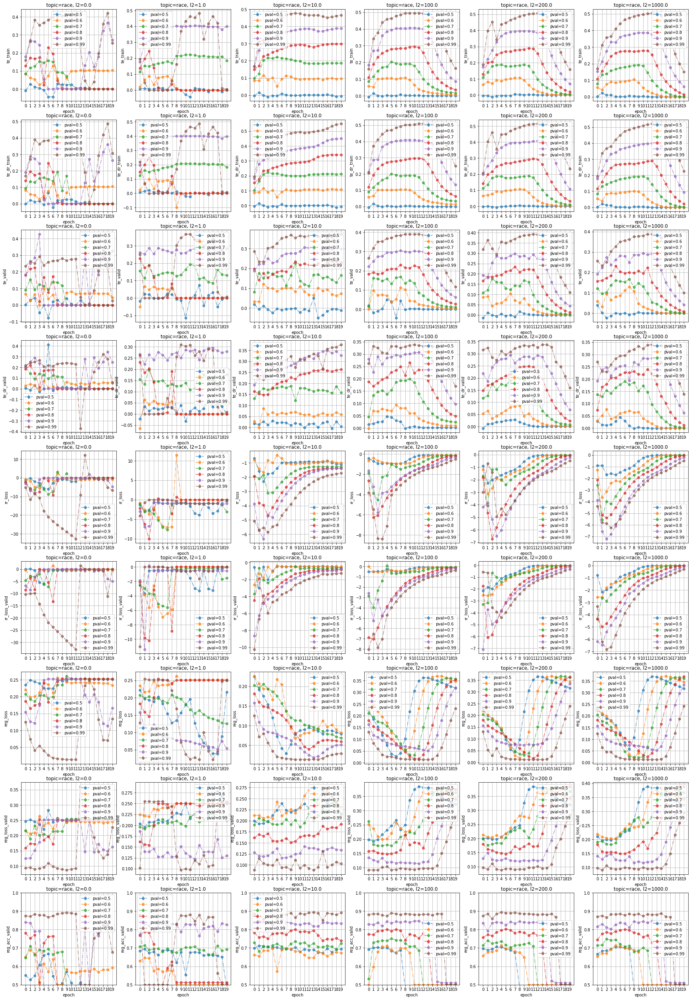

In [33]:
run_list=[1,]#without the best gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,200.0,1000.0]
topic_name="race"
num_sample=10000
debug_tidx=0
replace_strategy="gpt3"
gval_select_mode="loss" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}.tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=replace_strategy,
                           gval_select_mode=gval_select_mode,
    )
    



for pval in pval_list:
    print("======================================================")
    print("pval:",pval)
    #Selecting the best hyperparameter
    de_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
    #                                ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
                                   ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
#                        last_pos_selection=True,
    )
    print("DE(acc): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))

    #Selecting the best hyperparameter (de using the valid acc)
    de_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
#                                    ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
#                        last_pos_selection=True,
    )
    print("DE(loss): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))

    

    dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
                                   ("reg_loss_valid","inc"),
    #                                ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
#                        last_pos_selection=True,  
    #                    preselect_best_item = "rr_loss_valid",
    #                    best_item_order = "inc",
    )
    print("DR_reg: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


    dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                       select_items_config=[
                                   ("rr_loss_valid","inc"),
    #                                ("reg_loss_valid","inc"),
                                   ("reg_acc_valid","desc"),
                       ],
                       pval=pval,
#                        last_pos_selection=True
    #                    preselect_best_item = "rr_loss_valid",
    #                    best_item_order = "inc",
    )
    print("DR_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))